# Test model for system of polydisperse colloid 

**Author:** HOOMD-blue, YeNguyenEdalgo

Simulation of 250 polydisperse particles interacting through Lennard Jones potential and dipole-dipole interactions

## Initialize

Import the hoomd python package and the md component to execute MD simulations.

In [121]:
from math import *
import hoomd
import hoomd.md
import hoomd.deprecated
import numpy 
import random
from matplotlib import pyplot as plt 
#import gsd 
#import gsd.hoomd
#import gsd.pygsd

In [122]:
hoomd.context.initialize("");

## Parameters

In [123]:
change_seed = random.randint(1, 10000)
type="Dipole_Polydisperse"
Equil_fname="trajectory_Equilibrate_Polydisperse.gsd"

uc_length       = 10
diameter_A      = 1 
diameter_B      = 0.5
duplication     = 5

kB              = 1 
mass_A          = 1 
mass_B          = 0.5 

LJ_sigma_A      = 1
LJ_sigma_B      = 0.5
LJ_sigma_AB     = 0.75
LJ_epsilon      = 1 
r_cut_LJ        = 1
r_cut_LJ_A      = 1
r_cut_LJ_B      = 0.5
r_cut_LJ_AB     = 0.75

r_cut_dd        = 2*r_cut_LJ

drag_coeff      = 1
Temp            = 0.2
dipole_moment   = 2

step_size       = 0.005
total_step      = 1e8
log_period      = 1e3

## Construct unit cell

In [124]:
system = hoomd.init.read_gsd(Equil_fname, frame=-1)

notice(2): Group "all" created containing 250 particles


## Lennard Jones potential model

In [125]:
nl = hoomd.md.nlist.cell();

lj = hoomd.md.pair.lj(r_cut=r_cut_LJ, nlist=nl)

lj.pair_coeff.set('NP_A', 'NP_A', epsilon=LJ_epsilon, sigma=LJ_sigma_A, r_cut=r_cut_LJ_A, r_on=2*LJ_sigma_A);
lj.pair_coeff.set('NP_B', 'NP_B', epsilon=LJ_epsilon, sigma=LJ_sigma_B, r_cut=r_cut_LJ_B, r_on=2*LJ_sigma_B);
lj.pair_coeff.set('NP_A', 'NP_B', epsilon=LJ_epsilon, sigma=LJ_sigma_AB, r_cut=r_cut_LJ_AB, r_on=2*LJ_sigma_AB);

## Dipole-dipole inter-particle interaction model

In [126]:
"""Dipole-Dipole Potential: SWITCH ON After system is equilibrated""" 

DD = hoomd.md.pair.dipole(r_cut=r_cut_dd, nlist=nl)
DD.pair_coeff.set('NP_A', 'NP_A', mu=dipole_moment, A=1/(4*pi), kappa=0.0)
DD.pair_coeff.set('NP_B', 'NP_B', mu=dipole_moment, A=1/(4*pi), kappa=0.0)
DD.pair_coeff.set('NP_A', 'NP_B', mu=dipole_moment, A=1/(4*pi), kappa=0.0)

## Select integrator

In [127]:
hoomd.md.integrate.mode_standard(dt=step_size);

all = hoomd.group.all();
hoomd.md.integrate.langevin(group=all, kT=kB*Temp, seed=change_seed);

notice(2): integrate.langevin/bd is using specified gamma values


## Write output

tag         : 0
position    : (-11.174123764038086, 19.616321563720703, 24.8381290435791)
image       : (0, 0, 0)
velocity    : (0.0, 0.0, 0.0)
acceleration: (0.0, 0.0, 0.0)
charge      : 0.0
mass        : 1.0
diameter    : 1.0
type        : NP_A
typeid      : 0
body        : 4294967295
orientation : (1.0, 0.0, 0.0, 0.0)
mom. inertia: (0.0, 0.0, 0.0)
angular_momentum: (0.0, 0.0, 0.0, 0.0)
net_force   : (0.0, 0.0, 0.0)
net_energy  : 0.0
net_torque  : (0.0, 0.0, 0.0)
net_virial  : (0.0, 0.0, 0.0, 0.0, 0.0, 0.0)

tag         : 1
position    : (17.44381332397461, -1.0285162925720215, 6.289172172546387)
image       : (0, 0, 0)
velocity    : (0.0, 0.0, 0.0)
acceleration: (0.0, 0.0, 0.0)
charge      : 0.0
mass        : 0.5
diameter    : 0.5
type        : NP_B
typeid      : 1
body        : 4294967295
orientation : (1.0, 0.0, 0.0, 0.0)
mom. inertia: (0.0, 0.0, 0.0)
angular_momentum: (0.0, 0.0, 0.0, 0.0)
net_force   : (0.0, 0.0, 0.0)
net_energy  : 0.0
net_torque  : (0.0, 0.0, 0.0)
net_virial  : 

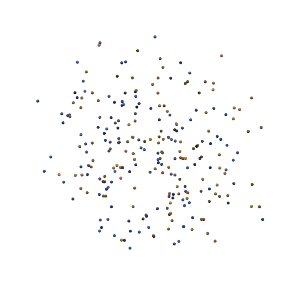

In [128]:
snap = system.take_snapshot(all=True)

for i in range(0,snap.particles.N): 
    print(system.particles[i])
    
import ex_render
ex_render.render_sphere_frame(system.take_snapshot())

In [129]:
hoomd.analyze.log(filename="log-output_"+type+".log",
                  quantities=['potential_energy', 'temperature'],
                  period=log_period,
                  overwrite=True);

hoomd.dump.gsd("trajectory_"+type+".gsd", period=1e5, group=all, overwrite=True);

## Run the simulation

In [130]:
hoomd.run(total_step);

notice(2): -- Neighborlist exclusion statistics -- :
notice(2): Particles with 0 exclusions             : 250
notice(2): Neighbors included by diameter          : no
notice(2): Neighbors excluded when in the same body: no
** starting run **


*Warning*: Integrator #0: Anisotropic integration requested, but no rotational degrees of freedom found for its group


Time 00:00:11 | Step 1050271 / 100900000 | TPS 15027 | ETA 01:50:44
Time 00:00:21 | Step 1205134 / 100900000 | TPS 15486.3 | ETA 01:47:17
Time 00:00:31 | Step 1352303 / 100900000 | TPS 14716.8 | ETA 01:52:44
Time 00:00:41 | Step 1489484 / 100900000 | TPS 13718.1 | ETA 02:00:46
Time 00:00:51 | Step 1620774 / 100900000 | TPS 13128.9 | ETA 02:06:01
Time 00:01:01 | Step 1750947 / 100900000 | TPS 13017.2 | ETA 02:06:56
Time 00:01:11 | Step 1885789 / 100900000 | TPS 13484.1 | ETA 02:02:23
Time 00:01:21 | Step 2021893 / 100900000 | TPS 13610.4 | ETA 02:01:04
Time 00:01:31 | Step 2154575 / 100900000 | TPS 13268.1 | ETA 02:04:02
Time 00:01:41 | Step 2285620 / 100900000 | TPS 13104.5 | ETA 02:05:25
Time 00:01:51 | Step 2418537 / 100900000 | TPS 13291.6 | ETA 02:03:29
Time 00:02:01 | Step 2542858 / 100900000 | TPS 12432 | ETA 02:11:51
Time 00:02:11 | Step 2673274 / 100900000 | TPS 13041.6 | ETA 02:05:31
Time 00:02:21 | Step 2798715 / 100900000 | TPS 12544 | ETA 02:10:20
Time 00:02:31 | Step 29253

Time 00:19:43 | Step 15691580 / 100900000 | TPS 12371.6 | ETA 01:54:47
Time 00:19:53 | Step 15816414 / 100900000 | TPS 12483.4 | ETA 01:53:35
Time 00:20:03 | Step 15940001 / 100900000 | TPS 12111 | ETA 01:56:55
Time 00:20:13 | Step 16064213 / 100900000 | TPS 12421.1 | ETA 01:53:49
Time 00:20:23 | Step 16187953 / 100900000 | TPS 12374 | ETA 01:54:05
Time 00:20:33 | Step 16311902 / 100900000 | TPS 12394.8 | ETA 01:53:44
Time 00:20:43 | Step 16435846 / 100900000 | TPS 12394.4 | ETA 01:53:34
Time 00:20:53 | Step 16559376 / 100900000 | TPS 12352.9 | ETA 01:53:47
Time 00:21:04 | Step 16682001 / 100900000 | TPS 11858 | ETA 01:58:22
Time 00:21:14 | Step 16805949 / 100900000 | TPS 12394.7 | ETA 01:53:04
Time 00:21:24 | Step 16929851 / 100900000 | TPS 12390.1 | ETA 01:52:57
Time 00:21:34 | Step 17053549 / 100900000 | TPS 12369.8 | ETA 01:52:58
Time 00:21:44 | Step 17177361 / 100900000 | TPS 12381.2 | ETA 01:52:42
Time 00:21:54 | Step 17302311 / 100900000 | TPS 12495 | ETA 01:51:30
Time 00:22:04 

Time 00:39:08 | Step 29937001 / 100900000 | TPS 10663.5 | ETA 01:50:54
Time 00:39:18 | Step 30050118 / 100900000 | TPS 11311.7 | ETA 01:44:23
Time 00:39:28 | Step 30173760 / 100900000 | TPS 12364.2 | ETA 01:35:20
Time 00:39:38 | Step 30286001 / 100900000 | TPS 11222.1 | ETA 01:44:52
Time 00:39:48 | Step 30403715 / 100900000 | TPS 11771.4 | ETA 01:39:48
Time 00:39:58 | Step 30526503 / 100900000 | TPS 12278.8 | ETA 01:35:31
Time 00:40:08 | Step 30646001 / 100900000 | TPS 11944.1 | ETA 01:38:01
Time 00:40:18 | Step 30769086 / 100900000 | TPS 12308.5 | ETA 01:34:57
Time 00:40:28 | Step 30892196 / 100900000 | TPS 12311 | ETA 01:34:46
Time 00:40:38 | Step 31014909 / 100900000 | TPS 12271.2 | ETA 01:34:55
Time 00:40:48 | Step 31137818 / 100900000 | TPS 12290.9 | ETA 01:34:35
Time 00:40:58 | Step 31257905 / 100900000 | TPS 12008.7 | ETA 01:36:39
Time 00:41:08 | Step 31380001 / 100900000 | TPS 11610.8 | ETA 01:39:47
Time 00:41:18 | Step 31504384 / 100900000 | TPS 12438.2 | ETA 01:32:59
Time 00:

Time 00:58:32 | Step 43868179 / 100900000 | TPS 12262.9 | ETA 01:17:30
Time 00:58:42 | Step 43990653 / 100900000 | TPS 12247.3 | ETA 01:17:26
Time 00:58:52 | Step 44113234 / 100900000 | TPS 12258.1 | ETA 01:17:12
Time 00:59:02 | Step 44236204 / 100900000 | TPS 12297 | ETA 01:16:47
Time 00:59:12 | Step 44356001 / 100900000 | TPS 11763.7 | ETA 01:20:06
Time 00:59:22 | Step 44478822 / 100900000 | TPS 12282.1 | ETA 01:16:33
Time 00:59:32 | Step 44601581 / 100900000 | TPS 12275.9 | ETA 01:16:26
Time 00:59:42 | Step 44724085 / 100900000 | TPS 12250.4 | ETA 01:16:25
Time 00:59:52 | Step 44846358 / 100900000 | TPS 12227.3 | ETA 01:16:24
Time 01:00:02 | Step 44969709 / 100900000 | TPS 12335 | ETA 01:15:34
Time 01:00:12 | Step 45090006 / 100900000 | TPS 12029.6 | ETA 01:17:19
Time 01:00:22 | Step 45212229 / 100900000 | TPS 12222.3 | ETA 01:15:56
Time 01:00:32 | Step 45335001 / 100900000 | TPS 12277 | ETA 01:15:25
Time 01:00:42 | Step 45457221 / 100900000 | TPS 12221.9 | ETA 01:15:36
Time 01:00:5

Time 01:17:56 | Step 58093100 / 100900000 | TPS 12339.6 | ETA 00:57:49
Time 01:18:06 | Step 58215949 / 100900000 | TPS 12284.9 | ETA 00:57:54
Time 01:18:17 | Step 58339001 / 100900000 | TPS 11698.3 | ETA 01:00:38
Time 01:18:27 | Step 58461840 / 100900000 | TPS 12283.8 | ETA 00:57:34
Time 01:18:37 | Step 58585524 / 100900000 | TPS 12368.4 | ETA 00:57:01
Time 01:18:47 | Step 58708966 / 100900000 | TPS 12344.1 | ETA 00:56:57
Time 01:18:57 | Step 58831910 / 100900000 | TPS 12294.3 | ETA 00:57:01
Time 01:19:07 | Step 58955545 / 100900000 | TPS 12363.4 | ETA 00:56:32
Time 01:19:17 | Step 59078001 / 100900000 | TPS 11845.8 | ETA 00:58:50
Time 01:19:27 | Step 59201909 / 100900000 | TPS 12390.8 | ETA 00:56:05
Time 01:19:37 | Step 59325241 / 100900000 | TPS 12333.1 | ETA 00:56:11
Time 01:19:47 | Step 59448718 / 100900000 | TPS 12347.7 | ETA 00:55:57
Time 01:19:57 | Step 59572334 / 100900000 | TPS 12361.5 | ETA 00:55:43
Time 01:20:07 | Step 59695028 / 100900000 | TPS 12269.4 | ETA 00:55:58
Time 0

Time 01:37:21 | Step 72398001 / 100900000 | TPS 11776.7 | ETA 00:40:20
Time 01:37:31 | Step 72520110 / 100900000 | TPS 12210.8 | ETA 00:38:44
Time 01:37:41 | Step 72642378 / 100900000 | TPS 12226.8 | ETA 00:38:31
Time 01:37:51 | Step 72765578 / 100900000 | TPS 12320 | ETA 00:38:03
Time 01:38:01 | Step 72888542 / 100900000 | TPS 12296.3 | ETA 00:37:58
Time 01:38:11 | Step 73011187 / 100900000 | TPS 12264.4 | ETA 00:37:53
Time 01:38:21 | Step 73132001 / 100900000 | TPS 11975.8 | ETA 00:38:38
Time 01:38:31 | Step 73255422 / 100900000 | TPS 12342.1 | ETA 00:37:19
Time 01:38:41 | Step 73378038 / 100900000 | TPS 12261.5 | ETA 00:37:24
Time 01:38:51 | Step 73501253 / 100900000 | TPS 12321.5 | ETA 00:37:03
Time 01:39:01 | Step 73624344 / 100900000 | TPS 12309.1 | ETA 00:36:55
Time 01:39:11 | Step 73747496 / 100900000 | TPS 12315.2 | ETA 00:36:44
Time 01:39:21 | Step 73870001 / 100900000 | TPS 11980.7 | ETA 00:37:36
Time 01:39:31 | Step 73992808 / 100900000 | TPS 12280.6 | ETA 00:36:31
Time 01:

Time 01:56:45 | Step 86640774 / 100900000 | TPS 12377.7 | ETA 00:19:12
Time 01:56:55 | Step 86763910 / 100900000 | TPS 12313.5 | ETA 00:19:08
Time 01:57:05 | Step 86887018 / 100900000 | TPS 12310.8 | ETA 00:18:58
Time 01:57:15 | Step 87010608 / 100900000 | TPS 12359 | ETA 00:18:43
Time 01:57:25 | Step 87130097 / 100900000 | TPS 11948.9 | ETA 00:19:12
Time 01:57:35 | Step 87252561 / 100900000 | TPS 12246.3 | ETA 00:18:34
Time 01:57:45 | Step 87375733 / 100900000 | TPS 12317.2 | ETA 00:18:17
Time 01:57:55 | Step 87498804 / 100900000 | TPS 12307.1 | ETA 00:18:08
Time 01:58:05 | Step 87621901 / 100900000 | TPS 12309.6 | ETA 00:17:58
Time 01:58:15 | Step 87745008 / 100900000 | TPS 12310.7 | ETA 00:17:48
Time 01:58:26 | Step 87867001 / 100900000 | TPS 11959.4 | ETA 00:18:09
Time 01:58:36 | Step 87989594 / 100900000 | TPS 12259.3 | ETA 00:17:33
Time 01:58:46 | Step 88112519 / 100900000 | TPS 12292.5 | ETA 00:17:20
Time 01:58:56 | Step 88235218 / 100900000 | TPS 12269.8 | ETA 00:17:12
Time 01:

Time 02:16:09 | Step 100884717 / 100900000 | TPS 12240.4 | ETA 00:00:01
Time 02:16:11 | Step 100900000 / 100900000 | TPS 12242.3 | ETA 00:00:00
Average TPS: 12240.8
---------
-- Neighborlist stats:
4437684 normal updates / 1000001 forced updates / 0 dangerous updates
n_neigh_min: 0 / n_neigh_max: 8 / n_neigh_avg: 1.96
shortest rebuild period: 9
-- Cell list stats:
Dimension: 20, 20, 20
n_min    : 0 / n_max: 6 / n_avg: 0.03125
** run complete **


# Examine the output

Use matplotlib to plot the potential energy vs time step.

In [131]:
import numpy as np
from matplotlib import pyplot as plt 
%matplotlib inline

data = numpy.genfromtxt(fname="log-output_"+type+".log", skip_header=True);

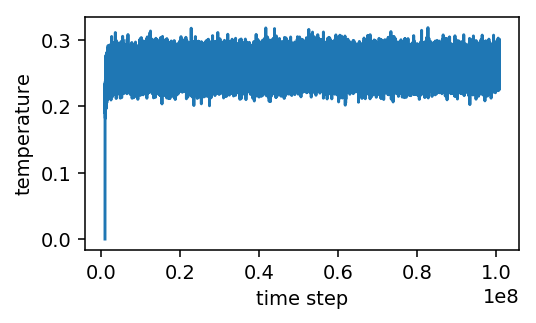

In [132]:
plt.figure(figsize=(4,2.2), dpi=140);
plt.plot(data[:,0], data[:,2]);
plt.xlabel('time step');
plt.ylabel('temperature');

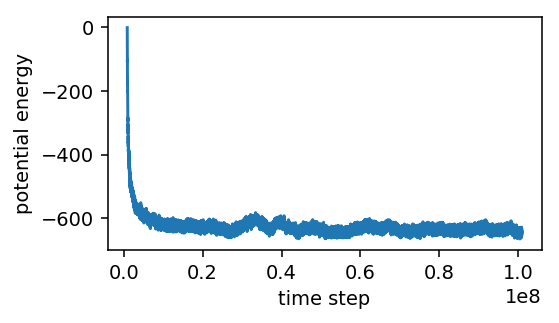

In [133]:
plt.figure(figsize=(4,2.2), dpi=140);
plt.plot(data[:,0], data[:,1]);
plt.xlabel('time step');
plt.ylabel('potential energy');

## **Equilibrate**

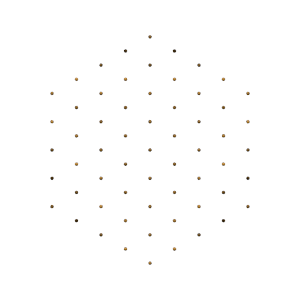

In [134]:
import ex_render
ex_render.display_movie(ex_render.render_sphere_frame, 'trajectory_Equilibrate_Polydisperse.gsd');

## **Dipole-Dipole Interations**

Magnitude of dipole moment **$\mu=2$**

Size: 11206.6025390625 KiB


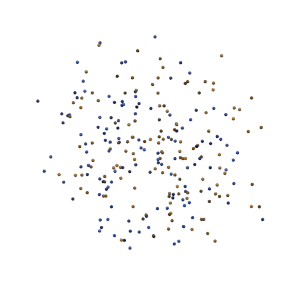

In [135]:
import ex_render
ex_render.display_movie(ex_render.render_sphere_frame, 'trajectory_Dipole_Polydisperse.gsd');